In [1]:
%cd ../..

/mnt/batch/tasks/shared/LS_root/mounts/clusters/jeffrey-uso9-03-dev-ci01/code/Users/jeffrey.tackes/ModernTS_2E


In [2]:
import os
import shutil
import json

import joblib
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"

from pathlib import Path

from tqdm.autonotebook import tqdm
from IPython.display import display, HTML
# %load_ext autoreload
# %autoreload 2
np.random.seed(42)
tqdm.pandas()

from statsforecast import StatsForecast
from neuralforecast import NeuralForecast
from neuralforecast.models import DLinear
from neuralforecast.auto import AutoDLinear
from neuralforecast.losses.pytorch import MQLoss
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import rmse, mae, mse, mase
from neuralforecast.losses.pytorch import MSE, MAE
from functools import partial

from ray import tune
from ray.tune.search.hyperopt import HyperOptSearch


import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

/tmp/ipykernel_775077/3853973502.py:15: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
2024-08-17 16:33:31,014	WARNING __init__.py:21 -- Package pickle5 becomes unnecessary in Python 3.8 and above. Its presence may confuse libraries including Ray. Please uninstall the package.
/anaconda/envs/demand_planning/lib/python3.10/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [3]:
TRAIN_SUBSAMPLE = True  # Trains a subsample of IDs to improve run speed
RETUNE = True  # if false, will use pre-trained hyperparameters when generating the AUTO NeuralForecast

In [4]:
preprocessed = Path("data/london_smart_meters/preprocessed")
output = Path("data/london_smart_meters/output")
try:
    #Reading the missing value imputed and train test split data
    train_df = pd.read_parquet(preprocessed/"selected_blocks_train_missing_imputed_feature_engg.parquet")
    # Read in the Validation dataset as test_df so that we predict on it
    test_df = pd.read_parquet(preprocessed/"selected_blocks_val_missing_imputed_feature_engg.parquet")
    # test_df = pd.read_parquet(preprocessed/"selected_blocks_test_missing_imputed_feature_engg.parquet")
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. Please make sure you have run 01-Feature Engineering.ipynb in Chapter06
    </div>
    """))

In [5]:
train_df.head(2)

,timestamp,LCLid,energy_consumption,frequency,series_length,stdorToU,Acorn,Acorn_grouped,file,holidays,...,timestamp_Minute_sin_1,timestamp_Minute_sin_2,timestamp_Minute_sin_3,timestamp_Minute_sin_4,timestamp_Minute_sin_5,timestamp_Minute_cos_1,timestamp_Minute_cos_2,timestamp_Minute_cos_3,timestamp_Minute_cos_4,timestamp_Minute_cos_5
0,2012-01-01 00:00:00,MAC000061,0.114,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,1.0,1.0,1.0,1.0
1,2012-01-01 00:30:00,MAC000061,0.113,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,5.665539e-16,-1.133108e-15,2.143751e-15,-2.266215e-15,6.123234e-16,-1.0,1.0,-1.0,1.0,-1.0


In [6]:
print("Total # of IDs Pre-Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Pre-Sampling:  150


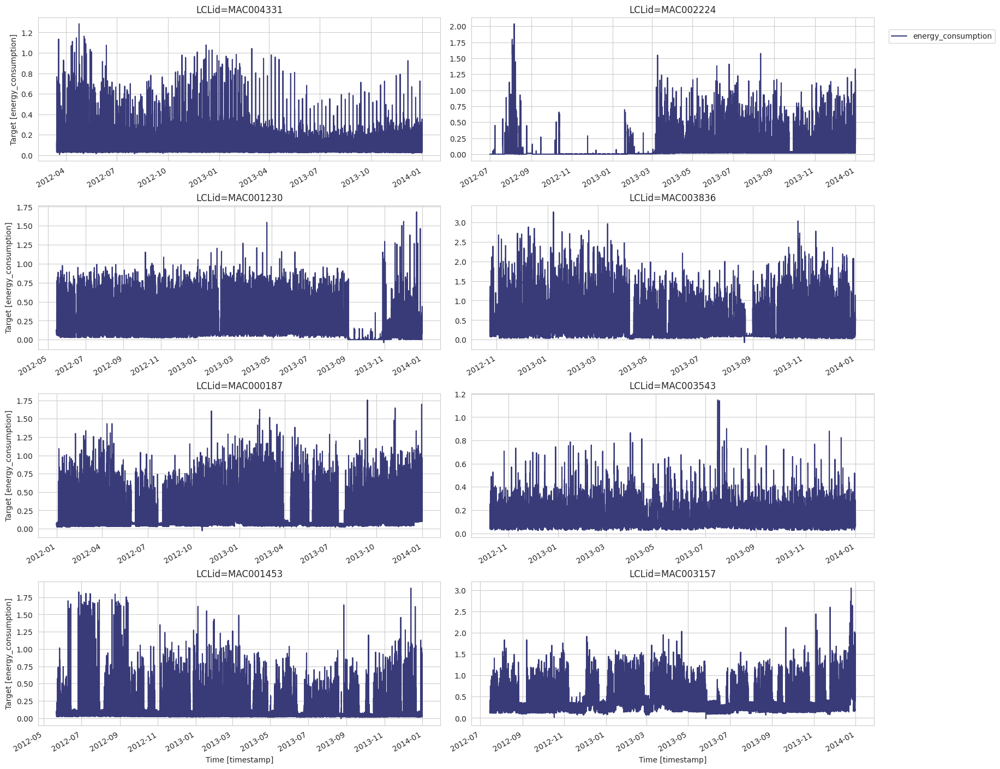

In [7]:
StatsForecast.plot(train_df, engine='matplotlib', id_col='LCLid',time_col= 'timestamp', target_col='energy_consumption')

In [8]:
# To run on smaller set of data for daster iteration.
if TRAIN_SUBSAMPLE:
    print("sub sampling")
    SAMPLE = 10
    sampled_LCLids = pd.Series(train_df.LCLid.unique().remove_unused_categories().categories).sample(SAMPLE, random_state=99).tolist()
    train_df = train_df.loc[train_df.LCLid.isin(sampled_LCLids)]
    test_df = test_df.loc[test_df.LCLid.isin(sampled_LCLids)]

sub sampling


In [9]:
print("Total # of IDs Post Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Post Sampling:  10


## Train, Validation, Test Set

In [10]:
print("Training Min Date: ", train_df.timestamp.min(), 
      "\nTraining Max Date: ", train_df.timestamp.max(), 
      "\nTesting Min Date: ", test_df.timestamp.min(),
      "\nTesting Max Date: ", test_df.timestamp.max()
)

Training Min Date:  2012-01-01 00:00:00 
Training Max Date:  2013-12-31 23:30:00 
Testing Min Date:  2014-01-01 00:00:00 
Testing Max Date:  2014-01-31 23:30:00


In [11]:
#Keeping 1 days aside as a validation set
cutoff = train_df.timestamp.max() - pd.Timedelta(1, "D")

validation_df = train_df[(train_df.timestamp>cutoff)].reset_index(drop=True) # validation prediction set
training_df = train_df[(train_df.timestamp<=cutoff)].reset_index(drop=True) # training set used for validation set

print(f"Train Max: {training_df.timestamp.max()} \nValidation Min: {validation_df.timestamp.min()} \nValidation Max: {validation_df.timestamp.max()}")
print(f"Validation Horizon: {len(validation_df.timestamp.unique())}")


Train Max: 2013-12-30 23:30:00 
Validation Min: 2013-12-31 00:00:00 
Validation Max: 2013-12-31 23:30:00
Validation Horizon: 48


##### Define Validation model parameters

In [12]:
h = 48
max_steps = 100

## Training DLinear Model

In [13]:
training_df[['LCLid']].nunique()[0]

10

In [14]:
len(training_df['LCLid'].unique())

10

In [18]:
model_untuned = [DLinear (h=h, input_size = 48*7, 
                max_steps = max_steps)]

model_untuned = NeuralForecast(models=model_untuned, freq='30min')
model_untuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type          | Params
------------------------------------------------
0 | loss          | MAE           | 0     
1 | padder_train  | ConstantPad1d | 0     
2 | scaler        | TemporalNorm  | 0     
3 | decomp        | SeriesDecomp  | 0     
4 | linear_trend  | Linear        | 16.2 K
5 | linear_season | Linear        | 16.2 K
------------------------------------------------
32.4 K    Trainable params
0         Non-trainable params
32.4 K    Total params
0.129     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [19]:
# Get Predictions for validation
pred_df =  model_untuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df.merge(validation_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,DLinear,energy_consumption
0,MAC000126,2013-12-31 00:00:00,0.238047,0.093
1,MAC000126,2013-12-31 00:30:00,-0.032096,0.109
2,MAC000126,2013-12-31 01:00:00,0.114841,0.082
3,MAC000126,2013-12-31 01:30:00,0.042209,0.067
4,MAC000126,2013-12-31 02:00:00,-0.062083,0.043


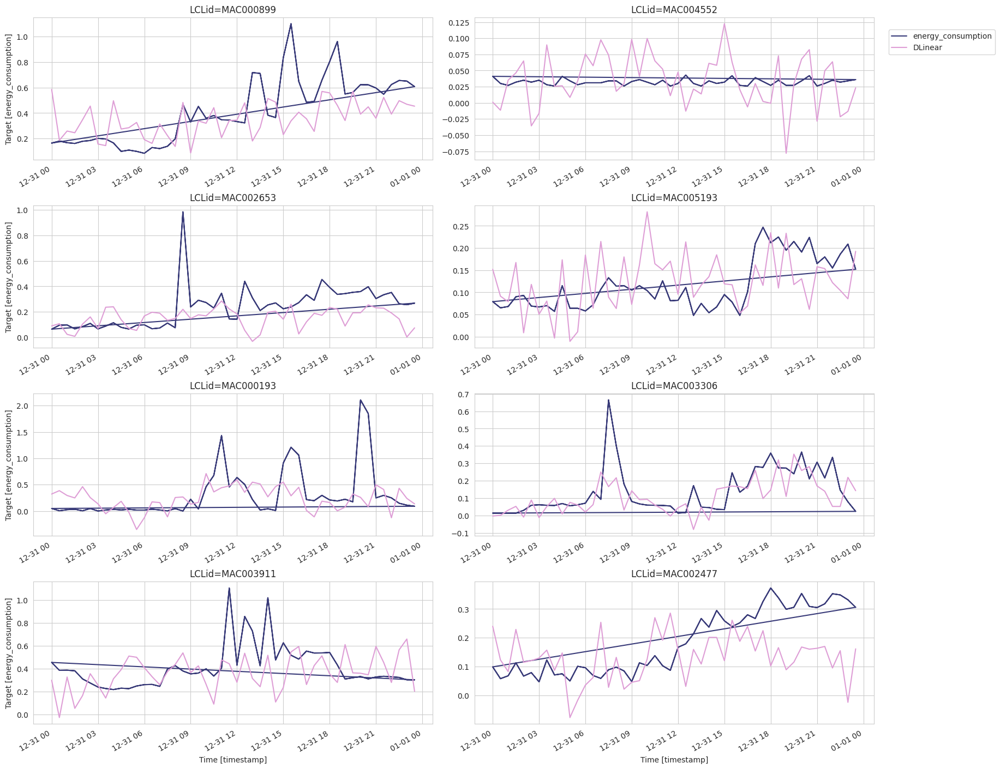

In [20]:
#visualize results
StatsForecast.plot(validation_df[['LCLid','timestamp','energy_consumption']], 
                   pred_df, engine='matplotlib', 
                   id_col='LCLid',
                   time_col= 'timestamp', 
                   target_col='energy_consumption',
                   models=['DLinear'])

#### Evaluate DLinear forecast

In [21]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
DLinear_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
DLinear_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [22]:
DLinear_metrics_agg

,metric,DLinear
0,rmse,0.168007
1,mae,0.122705
2,mse,0.043400
3,mase,1.101584


## DLinear Tuned
Since hyperparameters are key to performance in Neural Networks, NIXTLA has made this search each through the incorporation of Auto forecast.
Each NeuralForecast model has an AUTO class which allow you to easily tune your hyperparameters.

Auto Forecast can time, you can load the pre-trained hyperparameters or choose to retune on your own.
Set ```RETUNE = True``` if you wish to retune.


In [23]:
# Define the file path
config_file_path = 'notebooks/Chapter16/saved_params_config/DLinear_best_config.json'
try:
    with open(config_file_path, 'r') as config_file:
        loaded_config = json.load(config_file)
        print(loaded_config)
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. 
    </div>
    """))
    

In [27]:
DLinear_config = {
    "max_steps": max_steps,  # This parameter can be adjusted if needed
    "input_size": tune.choice([h,h*7,h*7*2,h*7*3]), # Size of input window
    "learning_rate": tune.loguniform(1e-4, 1e-1),  # Initial learning rate
    "scaler_type": tune.choice(["minmax", "standard"]),
    "batch_size": tune.choice([32, 64,128, 256]),
    "random_seed": tune.choice([10, 20,30]),
}

if RETUNE == True:
    models = [AutoDLinear(h=h, 
                     config = DLinear_config,
                     search_alg = HyperOptSearch(),
                     backend = 'ray',
                     num_samples = 100,
                     #cpus=10, 
                     )]

else:
    models = [AutoDLinear(h=h, 
                    config = loaded_config,
                    search_alg = None,
                    backend = 'ray',
                    #cpus=1
                    )]


model_tuned = NeuralForecast(models=models, freq='30min')
model_tuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption',  val_size = 48)

(_train_tune pid=899246) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_e8082b36_1_batch_size=256,h=48,input_size=1008,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_16-56-22/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:00:56,760	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.27it/s, v_num=0, train_loss_step=0.0816, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_013a1945_2_batch_size=64,h=48,input_size=672,learning_rate=0.0039,loss=ref_ph_de895953,max_steps=100,random_seed=30,sc_2024-08-17_16-56-28/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.49it/s, v_num=0, train_loss_step=0.531, train_loss_epoch=0.495]


2024-08-17 17:04:50,054	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.531, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_debb1f56_3_batch_size=64,h=48,input_size=336,learning_rate=0.0078,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_17-00-56/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:08:14,336	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.723, train_loss_epoch=0.723, valid_loss=0.0917]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_12760f2c_4_batch_size=256,h=48,input_size=1008,learning_rate=0.0140,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_17-04-50/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.574, train_loss_epoch=0.563]


2024-08-17 17:12:16,587	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Validation DataLoader 0: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.94it/s]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_fb34d4fe_5_batch_size=32,h=48,input_size=672,learning_rate=0.0065,loss=ref_ph_de895953,max_steps=100,random_seed=10,sc_2024-08-17_17-08-14/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.0677, train_loss_epoch=0.0774]


2024-08-17 17:15:52,542	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.0677, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_6b688bf0_6_batch_size=128,h=48,input_size=336,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_17-12-16/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.51it/s, v_num=0, train_loss_step=0.824, train_loss_epoch=0.726]


2024-08-17 17:19:13,146	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.824, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_7a20d6e1_7_batch_size=32,h=48,input_size=336,learning_rate=0.0089,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_17-15-52/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.51it/s, v_num=0, train_loss_step=0.0946, train_loss_epoch=0.088]


2024-08-17 17:22:29,552	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0946, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_8e788c00_8_batch_size=32,h=48,input_size=1008,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_17-19-13/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:26:22,054	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.0726, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_6315f8fd_9_batch_size=32,h=48,input_size=1008,learning_rate=0.0037,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_17-22-29/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:30:24,614	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.540, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_409de684_10_batch_size=32,h=48,input_size=336,learning_rate=0.0065,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_17-26-22/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.61it/s, v_num=0, train_loss_step=0.904, train_loss_epoch=0.602]


2024-08-17 17:34:05,640	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.904, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_783338e3_11_batch_size=32,h=48,input_size=1008,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_17-30-24/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.586, train_loss_epoch=0.609]


2024-08-17 17:38:08,860	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.586, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_7141f286_12_batch_size=32,h=48,input_size=336,learning_rate=0.0605,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_17-34-05/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking DataLoader 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              | 0/1 [00:00<?, ?it/s]


2024-08-17 17:41:30,606	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=1.030, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_0a5a3c70_13_batch_size=32,h=48,input_size=336,learning_rate=0.0205,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_17-38-08/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.58it/s, v_num=0, train_loss_step=0.626, train_loss_epoch=0.650]


2024-08-17 17:45:02,178	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.626, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_0e89abce_14_batch_size=256,h=48,input_size=48,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_17-41-30/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.58it/s, v_num=0, train_loss_step=0.251, train_loss_epoch=0.261]


2024-08-17 17:48:16,978	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.251, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c34e5642_15_batch_size=128,h=48,input_size=48,learning_rate=0.0396,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_17-45-02/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:51:22,149	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}



Validation DataLoader 0: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.31it/s]

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_0333e94e_16_batch_size=256,h=48,input_size=336,learning_rate=0.0044,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_17-48-17/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.596, train_loss_epoch=0.619]


2024-08-17 17:54:57,378	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.33it/s, v_num=0, train_loss_step=0.596, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_0b1aa96c_17_batch_size=256,h=48,input_size=336,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_17-51-22/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:58:35,298	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.28it/s, v_num=0, train_loss_step=0.0843, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_ef7e9d22_18_batch_size=256,h=48,input_size=336,learning_rate=0.0117,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_17-54-57/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.918, train_loss_epoch=0.614]


2024-08-17 18:02:26,658	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.918, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_ff56ec5b_19_batch_size=32,h=48,input_size=1008,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_17-58-35/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:07:11,054	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.24it/s, v_num=0, train_loss_step=0.524, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_95157457_20_batch_size=128,h=48,input_size=672,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_18-02-26/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:11:11,067	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.507, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_7c498ae5_21_batch_size=64,h=48,input_size=336,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_18-07-11/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.0925, train_loss_epoch=0.0858]


2024-08-17 18:14:41,682	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.29it/s, v_num=0, train_loss_step=0.0925, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_3f8eb5e3_22_batch_size=128,h=48,input_size=672,learning_rate=0.0018,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_18-11-11/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:18:18,930	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.504, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c0a0174f_23_batch_size=64,h=48,input_size=672,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_18-14-41/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.065, train_loss_epoch=0.0748]


2024-08-17 18:21:45,330	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.065, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_d4d26550_24_batch_size=64,h=48,input_size=672,learning_rate=0.0020,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_18-18-18/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:25:17,330	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0701, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_d6aaecde_25_batch_size=128,h=48,input_size=672,learning_rate=0.0018,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_18-21-45/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:28:44,530	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0652, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_e63af146_26_batch_size=64,h=48,input_size=672,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_18-25-17/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:32:26,996	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.065, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_201c56d7_27_batch_size=128,h=48,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_18-28-44/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.0685, train_loss_epoch=0.0787]


2024-08-17 18:35:59,817	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.0685, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_d5ff008a_28_batch_size=128,h=48,input_size=672,learning_rate=0.0026,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_18-32-27/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.0658, train_loss_epoch=0.0753]


2024-08-17 18:39:28,175	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.29it/s, v_num=0, train_loss_step=0.0658, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_2e9f9b48_29_batch_size=64,h=48,input_size=48,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,random_seed=10,sc_2024-08-17_18-35-59/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:42:47,120	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.255, train_loss_epoch=0.255, valid_loss=0.154]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_3d2a323c_30_batch_size=128,h=48,input_size=672,learning_rate=0.0220,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_18-39-28/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.583, train_loss_epoch=0.693]


2024-08-17 18:46:23,742	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.583, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_cf3cfc6c_31_batch_size=64,h=48,input_size=672,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_18-42-47/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.55it/s, v_num=0, train_loss_step=0.0667, train_loss_epoch=0.0632]


2024-08-17 18:49:42,858	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0667, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_076d56c7_32_batch_size=64,h=48,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_18-46-23/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.605, train_loss_epoch=0.718]


2024-08-17 18:53:26,154	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.33it/s, v_num=0, train_loss_step=0.605, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_18a91cf6_33_batch_size=64,h=48,input_size=672,learning_rate=0.0029,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_18-49-42/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.509, train_loss_epoch=0.617]


2024-08-17 18:57:13,933	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.509, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_727619e9_34_batch_size=128,h=48,input_size=48,learning_rate=0.0051,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_18-53-26/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:00:27,867	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.238, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_dcdf3a1d_35_batch_size=64,h=48,input_size=672,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_18-57-13/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=0.517, train_loss_epoch=0.625]


2024-08-17 19:04:11,034	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.517, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_1161f59e_36_batch_size=128,h=48,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_19-00-27/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.50it/s, v_num=0, train_loss_step=0.0706, train_loss_epoch=0.0808]


2024-08-17 19:07:49,759	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.0706, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_617a90be_37_batch_size=64,h=48,input_size=672,learning_rate=0.0023,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_19-04-11/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
2024-08-17 19:11:50,770	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c67ebd07_38_batch_size=128,h=48,input_size=672,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_19-07-49/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.0668, train_loss_epoch=0.0633]


2024-08-17 19:15:43,864	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0668, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c5115235_39_batch_size=64,h=48,input_size=1008,learning_rate=0.0956,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_19-11-50/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=1.360, train_loss_epoch=1.430]


2024-08-17 19:20:16,726	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=1.360, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_9326a2e8_40_batch_size=128,h=48,input_size=48,learning_rate=0.0091,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_19-15-43/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.50it/s, v_num=0, train_loss_step=0.775, train_loss_epoch=0.825]


2024-08-17 19:23:49,442	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.775, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_06fb4d08_41_batch_size=256,h=48,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_19-20-16/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.0834, train_loss_epoch=0.0799]


2024-08-17 19:27:20,650	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0834, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_5e61f725_42_batch_size=64,h=48,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_19-23-49/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:31:56,930	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.24it/s, v_num=0, train_loss_step=0.563, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c5691cc8_43_batch_size=128,h=48,input_size=672,learning_rate=0.0035,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_19-27-20/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.0707, train_loss_epoch=0.082]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
2024-08-17 19:35:45,406	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_50bc9309_44_batch_size=256,h=48,input_size=672,learning_rate=0.0057,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_19-31-56/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.519, train_loss_epoch=0.630]


2024-08-17 19:39:52,034	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.519, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_84e3cd99_45_batch_size=128,h=48,input_size=48,learning_rate=0.0189,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_19-35-45/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.58it/s, v_num=0, train_loss_step=0.240, train_loss_epoch=0.250]


2024-08-17 19:43:26,715	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.240, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_f64e27c1_46_batch_size=32,h=48,input_size=1008,learning_rate=0.0086,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_19-39-52/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.541, train_loss_epoch=0.530]


2024-08-17 19:48:00,886	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.541, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c652130b_47_batch_size=64,h=48,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_19-43-26/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.576, train_loss_epoch=0.542]


2024-08-17 19:51:32,603	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.576, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_cea6e037_48_batch_size=256,h=48,input_size=48,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_19-48-00/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:54:58,074	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.178, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c0f92985_49_batch_size=32,h=48,input_size=1008,learning_rate=0.0469,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_19-51-32/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:59:24,806	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.864, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_59026e5f_50_batch_size=128,h=48,input_size=672,learning_rate=0.0123,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_19-54-58/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.0722, train_loss_epoch=0.0811]


2024-08-17 20:02:58,934	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.0722, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_e2e5d494_51_batch_size=64,h=48,input_size=336,learning_rate=0.0268,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_19-59-24/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.949, train_loss_epoch=0.646]


2024-08-17 20:07:17,046	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.29it/s, v_num=0, train_loss_step=0.949, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c468f750_52_batch_size=32,h=48,input_size=672,learning_rate=0.0043,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_20-02-58/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:11:14,122	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0668, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_774d1661_53_batch_size=256,h=48,input_size=336,learning_rate=0.0014,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_20-07-17/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:15:16,018	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.708, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_49702ccc_54_batch_size=128,h=48,input_size=672,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_20-11-14/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.066, train_loss_epoch=0.0759]


2024-08-17 20:19:12,276	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.066, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_f145edde_55_batch_size=64,h=48,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_20-15-16/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
2024-08-17 20:23:37,020	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_f081ea78_56_batch_size=128,h=48,input_size=48,learning_rate=0.0032,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_20-19-12/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.63it/s, v_num=0, train_loss_step=0.166, train_loss_epoch=0.183]


2024-08-17 20:26:52,094	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.166, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_1d978df4_57_batch_size=32,h=48,input_size=672,learning_rate=0.0069,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_20-23-37/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.542, train_loss_epoch=0.505]


2024-08-17 20:30:35,042	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.26it/s, v_num=0, train_loss_step=0.542, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_730de092_58_batch_size=64,h=48,input_size=336,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-26-52/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:34:02,314	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.0965, train_loss_epoch=0.0965, valid_loss=0.0888]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_05ae9e69_59_batch_size=256,h=48,input_size=672,learning_rate=0.0021,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_20-30-35/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.506, train_loss_epoch=0.613]


2024-08-17 20:37:56,200	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.506, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_4c812d39_60_batch_size=128,h=48,input_size=672,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_20-34-02/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0654, train_loss_epoch=0.0753]


2024-08-17 20:41:34,754	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.33it/s, v_num=0, train_loss_step=0.0654, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_9ec9399a_61_batch_size=64,h=48,input_size=1008,learning_rate=0.0157,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_20-37-56/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:45:43,635	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.0883, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_e6468c3b_62_batch_size=128,h=48,input_size=336,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_20-41-34/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.855, train_loss_epoch=0.757]


2024-08-17 20:49:24,720	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.855, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_574266c2_63_batch_size=32,h=48,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_20-45-43/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.62it/s, v_num=0, train_loss_step=0.0738, train_loss_epoch=0.0701]


2024-08-17 20:52:55,226	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.0738, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_543e2c26_64_batch_size=64,h=48,input_size=48,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,random_seed=10,sc_2024-08-17_20-49-24/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.870, train_loss_epoch=0.916]


2024-08-17 20:56:51,920	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.870, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_6e72b83d_65_batch_size=128,h=48,input_size=672,learning_rate=0.0016,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_20-52-55/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:00:32,541	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.29it/s, v_num=0, train_loss_step=0.065, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_4493bc0d_66_batch_size=128,h=48,input_size=672,learning_rate=0.0026,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_20-56-51/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=0.0657, train_loss_epoch=0.0754]


2024-08-17 21:04:12,102	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.36it/s, v_num=0, train_loss_step=0.0657, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_27437164_67_batch_size=128,h=48,input_size=672,learning_rate=0.0018,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-00-32/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:07:41,239	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0653, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_8f39fe4d_68_batch_size=128,h=48,input_size=672,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-04-12/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:11:17,794	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.33it/s, v_num=0, train_loss_step=0.0652, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_2e228193_69_batch_size=128,h=48,input_size=672,learning_rate=0.0050,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-07-41/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.58it/s, v_num=0, train_loss_step=0.067, train_loss_epoch=0.0765]


2024-08-17 21:14:57,590	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.067, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_ef75252a_70_batch_size=128,h=48,input_size=672,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-11-17/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=0.065, train_loss_epoch=0.0748]


2024-08-17 21:18:39,758	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.065, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_06d6fe4f_71_batch_size=128,h=48,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-14-57/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.57it/s, v_num=0, train_loss_step=0.0693, train_loss_epoch=0.0795]


2024-08-17 21:22:11,463	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.0693, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_f23ec521_72_batch_size=128,h=48,input_size=672,learning_rate=0.0040,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-18-39/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.55it/s, v_num=0, train_loss_step=0.0666, train_loss_epoch=0.0761]


2024-08-17 21:25:47,266	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.0666, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_22fdfc60_73_batch_size=64,h=48,input_size=672,learning_rate=0.0032,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_21-22-11/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:29:21,790	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.0658, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_328e1754_74_batch_size=128,h=48,input_size=672,learning_rate=0.0023,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-25-47/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.0657, train_loss_epoch=0.0752]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
2024-08-17 21:33:01,734	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_4f31030f_75_batch_size=256,h=48,input_size=672,learning_rate=0.0105,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-29-21/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.0706, train_loss_epoch=0.0798]


2024-08-17 21:36:56,179	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0706, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_74ea49ee_76_batch_size=128,h=48,input_size=48,learning_rate=0.0070,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_21-33-01/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:40:46,246	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.775, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_bca52ab8_77_batch_size=64,h=48,input_size=1008,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_21-36-56/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.0604, train_loss_epoch=0.0674]


2024-08-17 21:45:05,766	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.28it/s, v_num=0, train_loss_step=0.0604, train_loss_epoch=0.0604, valid_loss=0.0875]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_bed16bfa_78_batch_size=128,h=48,input_size=336,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_21-40-46/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=0.0965, train_loss_epoch=0.0897]


2024-08-17 21:48:38,614	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.0965, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_d13595e3_79_batch_size=32,h=48,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_21-45-05/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:52:06,875	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.561, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_9bf42dc5_80_batch_size=64,h=48,input_size=672,learning_rate=0.0011,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_21-48-38/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=0.0651, train_loss_epoch=0.0748]


2024-08-17 21:55:19,508	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}



Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0651, train_loss_epoch=0.0651, valid_loss=0.0877]

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_13d7b578_81_batch_size=256,h=48,input_size=672,learning_rate=0.0061,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-52-06/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:58:51,231	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.29it/s, v_num=0, train_loss_step=0.521, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_6556c81d_82_batch_size=128,h=48,input_size=672,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_21-55-19/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.0667, train_loss_epoch=0.0632]


2024-08-17 22:02:01,533	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0667, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_5136797c_83_batch_size=64,h=48,input_size=48,learning_rate=0.0026,loss=ref_ph_de895953,max_steps=100,random_seed=10,sc_2024-08-17_21-58-51/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.61it/s, v_num=0, train_loss_step=0.774, train_loss_epoch=0.824]


2024-08-17 22:05:00,278	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=0.774, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_90e151a3_84_batch_size=128,h=48,input_size=1008,learning_rate=0.0293,loss=ref_ph_de895953,max_steps=100,random_seed=20_2024-08-17_22-02-01/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:08:46,366	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.167, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_93c207f1_85_batch_size=32,h=48,input_size=336,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_22-05-00/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=0.695, train_loss_epoch=0.721]


2024-08-17 22:12:00,970	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.695, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_f34fd6b6_86_batch_size=64,h=48,input_size=672,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_22-08-46/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.50it/s, v_num=0, train_loss_step=0.0651, train_loss_epoch=0.0749]


2024-08-17 22:15:06,337	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.0651, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_d02bda7d_87_batch_size=128,h=48,input_size=672,learning_rate=0.0022,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_22-12-00/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.524, train_loss_epoch=0.486]


2024-08-17 22:18:45,965	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.27it/s, v_num=0, train_loss_step=0.524, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_d0c1bcdd_88_batch_size=64,h=48,input_size=672,learning_rate=0.0048,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_22-15-06/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:22:23,988	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.0668, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_b7dbf6b4_89_batch_size=64,h=48,input_size=672,learning_rate=0.0082,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_22-18-46/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.0685, train_loss_epoch=0.0784]


2024-08-17 22:25:58,686	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0685, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_5c5c0c94_90_batch_size=64,h=48,input_size=48,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_22-22-24/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.56it/s, v_num=0, train_loss_step=1.170, train_loss_epoch=1.300]


2024-08-17 22:29:30,690	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=1.170, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_52f34295_91_batch_size=64,h=48,input_size=1008,learning_rate=0.0992,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_22-25-58/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.558, train_loss_epoch=0.599]


2024-08-17 22:33:52,860	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.558, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_a3904e44_92_batch_size=64,h=48,input_size=336,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_22-29-30/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.52it/s, v_num=0, train_loss_step=0.629, train_loss_epoch=0.655]


2024-08-17 22:37:47,912	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.36it/s, v_num=0, train_loss_step=0.629, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_2996ba27_93_batch_size=64,h=48,input_size=672,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_22-33-52/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:41:27,631	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=0.0652, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_004e3dff_94_batch_size=64,h=48,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_22-37-47/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:44:20,129	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.0816, train_loss_epoch=0.0816, valid_loss=0.114]


(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 20
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_803604c4_95_batch_size=64,h=48,input_size=672,learning_rate=0.0034,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_22-41-27/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=0.567, train_loss_epoch=0.655]


2024-08-17 22:47:28,443	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.567, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_c25bbbc2_96_batch_size=256,h=48,input_size=48,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_22-44-20/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.70it/s, v_num=0, train_loss_step=0.168, train_loss_epoch=0.185]


2024-08-17 22:50:03,986	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.52it/s, v_num=0, train_loss_step=0.168, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_a0034825_97_batch_size=64,h=48,input_size=1008,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_22-47-28/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=899246) 4 | linear_tre

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.64it/s, v_num=0, train_loss_step=0.504, train_loss_epoch=0.491]


2024-08-17 22:53:27,513	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.62it/s, v_num=0, train_loss_step=0.504, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_9005a4cb_98_batch_size=64,h=48,input_size=672,learning_rate=0.0145,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_22-50-04/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.62it/s, v_num=0, train_loss_step=0.0758, train_loss_epoch=0.084]


2024-08-17 22:56:13,576	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.0758, train_loss_epoch=

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=899246) Seed set to 30
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_886e8bfa_99_batch_size=32,h=48,input_size=336,learning_rate=0.0014,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_22-53-27/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=899246) 3 | decomp        | SeriesDecomp  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.61it/s, v_num=0, train_loss_step=0.889, train_loss_epoch=0.587]


2024-08-17 22:59:02,926	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.889, train_loss_epoch

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=899246) Seed set to 10
(_train_tune pid=899246) GPU available: False, used: False
(_train_tune pid=899246) TPU available: False, using: 0 TPU cores
(_train_tune pid=899246) IPU available: False, using: 0 IPUs
(_train_tune pid=899246) HPU available: False, using: 0 HPUs
(_train_tune pid=899246) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-21/_train_tune_63603cb8_100_batch_size=64,h=48,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_22-56-13/lightning_logs
(_train_tune pid=899246) 
(_train_tune pid=899246)   | Name          | Type          | Params
(_train_tune pid=899246) ------------------------------------------------
(_train_tune pid=899246) 0 | loss          | MAE           | 0     
(_train_tune pid=899246) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=899246) 2 | scaler        | TemporalNorm  | 0

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:01:54,183	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=899246) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.0705, train_loss_epoch=0

(_train_tune pid=899246) `Trainer.fit` stopped: `max_steps=100` reached.
Seed set to 10
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type          | Params
------------------------------------------------
0 | loss          | MAE           | 0     
1 | padder_train  | ConstantPad1d | 0     
2 | scaler        | TemporalNorm  | 0     
3 | decomp        | SeriesDecomp  | 0     
4 | linear_trend  | Linear        | 32.3 K
5 | linear_season | Linear        | 32.3 K
------------------------------------------------
64.6 K    Trainable params
0         Non-trainable params
64.6 K    Total params
0.258     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


The results of the tuning can then be viewed by running the below.

In [28]:
DLinear_best_config = model_tuned.models[0].results.get_best_result().config

# Remove specific keys using the pop method and then saving so we can extract parameters later
DLinear_best_config.pop("loss", None)
DLinear_best_config.pop("valid_loss", None)
DLinear_best_config.pop("h", None)

# Save the filtered configuration to a JSON file
with open(config_file_path, 'w') as config_file:
    json.dump(DLinear_best_config, config_file, indent=4)

print("Best configuration as string:")
print(DLinear_best_config)

Best configuration as string:
{'max_steps': 100, 'input_size': 672, 'learning_rate': 0.001718190866866424, 'scaler_type': 'minmax', 'batch_size': 64, 'random_seed': 10}


In [29]:
results = model_tuned.models[0].results.get_dataframe()
results[['loss', 'train_loss', 'timestamp', 
       'training_iteration', 
        'config/max_steps', 'config/input_size',
       'config/learning_rate', 'config/h', 'config/loss',
       ]].head(2)

,loss,train_loss,timestamp,training_iteration,config/max_steps,config/input_size,config/learning_rate,config/h,config/loss
0,0.124988,0.081609,1723914056,1,100,1008,0.000109,48,MAE()
1,0.091692,0.531200,1723914290,1,100,672,0.003872,48,MAE()


In [30]:
pred_df_autoDLinear =  model_tuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df_autoDLinear.merge(pred_df[['LCLid','timestamp','energy_consumption','DLinear']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoDLinear,energy_consumption,DLinear
0,MAC000126,2013-12-31 00:00:00,0.111908,0.093,0.238047
1,MAC000126,2013-12-31 00:30:00,0.087746,0.109,-0.032096
2,MAC000126,2013-12-31 01:00:00,0.065582,0.082,0.114841
3,MAC000126,2013-12-31 01:30:00,0.088480,0.067,0.042209
4,MAC000126,2013-12-31 02:00:00,0.048342,0.043,-0.062083


In [31]:
fcst_mase = partial(mase, seasonality=48)

autoDLinear_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

autoDLinear_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [32]:
autoDLinear_metrics_agg

,metric,AutoDLinear,DLinear
0,rmse,0.139212,0.168007
1,mae,0.086352,0.122705
2,mse,0.033651,0.043400
3,mase,0.754371,1.101584


## TEST SET Predictions

In [33]:
h_test = len(test_df.timestamp.unique()) # horizon of the test set

if RETUNE == True:
    config = DLinear_best_config
else:
    config = loaded_config

models_test = [AutoDLinear(h=h_test, 
                    config = config,
                    search_alg = None,
                    backend = 'ray',
                    )]

models_test = NeuralForecast(models=models_test, freq='30min')
models_test.fit(train_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

(_train_tune pid=1035150) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=1035150) Seed set to 10
(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00000_0_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1035150) Seed set to 10
(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00001_1_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=

(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) Seed set to 10
(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00002_2_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=1035150) 4 | linear_trend  | Linear        | 1.0 M 
(_train_tune pid=10351

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1035150) Seed set to 10
(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00003_3_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=

(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1035150) Seed set to 10


(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00004_4_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=1035150) 4 | linear_trend  | Linear        | 1.0 M 
(_train_tune pid=1035150) 5 | linear_season | Linear        | 1

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) Seed set to 10
(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00005_5_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=1035150) 4 | linear_trend  | Linear        | 1.0 M 
(_train_tune pid=10351

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1035150) Seed set to 10
(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00006_6_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=

(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) Seed set to 10
(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00007_7_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=1035150) 4 | linear_trend  | Linear        | 1.0 M 
(_train_tune pid=10351

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1035150) Seed set to 10


(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00008_8_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=1035150) 4 | linear_trend  | Linear        | 1.0 M 
(_train_tune pid=1035150) 5 | linear_season | Linear        | 1

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1035150) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

(_train_tune pid=1035150) Seed set to 10
(_train_tune pid=1035150) GPU available: False, used: False
(_train_tune pid=1035150) TPU available: False, using: 0 TPU cores
(_train_tune pid=1035150) IPU available: False, using: 0 IPUs
(_train_tune pid=1035150) HPU available: False, using: 0 HPUs
(_train_tune pid=1035150) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_23-02-15/_train_tune_bed06_00009_9_2024-08-17_23-02-15/lightning_logs
(_train_tune pid=1035150) 
(_train_tune pid=1035150)   | Name          | Type          | Params
(_train_tune pid=1035150) ------------------------------------------------
(_train_tune pid=1035150) 0 | loss          | MAE           | 0     
(_train_tune pid=1035150) 1 | padder_train  | ConstantPad1d | 0     
(_train_tune pid=1035150) 2 | scaler        | TemporalNorm  | 0     
(_train_tune pid=1035150) 3 | decomp        | SeriesDecomp  | 0     
(_train_tune pid=1035150) 4 | linear_trend  | Linear        | 1.0 M 
(_train_tune pid=10351

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1035150)Seed set to 10
 `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1035150) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.0817, train_loss_epoch

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type          | Params
------------------------------------------------
0 | loss          | MAE           | 0     
1 | padder_train  | ConstantPad1d | 0     
2 | scaler        | TemporalNorm  | 0     
3 | decomp        | SeriesDecomp  | 0     
4 | linear_trend  | Linear        | 1.0 M 
5 | linear_season | Linear        | 1.0 M 
------------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
8.011     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [34]:
pred_df_test =  models_test.predict(futr_df=test_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df_test = pred_df_test.merge(test_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df_test.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoDLinear,energy_consumption
0,MAC000126,2014-01-01 00:00:00,0.169190,0.193
1,MAC000126,2014-01-01 00:30:00,0.131648,0.119
2,MAC000126,2014-01-01 01:00:00,0.087072,0.130
3,MAC000126,2014-01-01 01:30:00,0.086677,0.086
4,MAC000126,2014-01-01 02:00:00,0.059342,0.067


In [35]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
DLinear_metrics_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
DLinear_metrics_agg_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [36]:
DLinear_metrics_agg_test

,metric,AutoDLinear
0,rmse,0.170838
1,mae,0.098189
2,mse,0.036333
3,mase,0.845237


In [37]:
DLinear_metrics_test.head()

,LCLid,metric,AutoDLinear
0,MAC000126,rmse,0.165740
1,MAC000193,rmse,0.354769
2,MAC000899,rmse,0.246724
3,MAC002477,rmse,0.143069
4,MAC002653,rmse,0.123984


In [38]:
DLinear_metrics_agg_test.to_pickle(output/'DLinear_metrics_agg_test.pkl')
DLinear_metrics_test.to_pickle(output/'DLinear_metrics_test.pkl')

Bad pipe message: %s [b'z\xf1`\x82\xae\xc7\xc8\x85\xf0+\r\t=\xb0|\x92\x9f[ \xc0]$\x19\xe3\xdeN\xb5\xa8\x19\x8e\xe8\xd0\x08\xb7U\xe6Pk;\xd3\x13\xe6-\xf3\x99l\x00\xb9COS\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n']
Bad pipe message: %s [b',\x91\xd38\x1b\x9b\x1cS\xc9\x97\xef<\xbd\x1aE GY \xba\xb0-\xbd2\x03\x0eE\xea\xd8=\x8e\x0c8\xf8\xe0C\xcdc\x01\xdc\xe3^\xc8\xff\xaa\x89\xf5\xcc/o \x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127', b'.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00']
Bad pipe message: %s [b'\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01']
Bad pipe message: %s [b"\xfdB\x13\x1e\xce\x90\xadj\xbc\xd4\x07\xe1(h\x84\xac\xe3\x1d\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\